In [1]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Model
from scipy.spatial.distance import cosine

# Initialize ResNet50 model for feature extraction
base_model = ResNet50(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('avg_pool').output)

def extract_features(img_path, model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    return features.flatten()

# Directory containing images
image_dir = '/home/teji/SEM-6/DL/PROJECT/Imagedudep/Test_Images'

# Extract features for each image
features_dict = {}
for img_name in os.listdir(image_dir):
    img_path = os.path.join(image_dir, img_name)
    features = extract_features(img_path, model)
    features_dict[img_name] = features

# Calculate cosine similarity and find duplicates
duplicates = {}
threshold = 0.5  # cosine similarity threshold for considering images as duplicates
for img_name1, features1 in features_dict.items():
    for img_name2, features2 in features_dict.items():
        if img_name1 != img_name2:
            sim = 1 - cosine(features1, features2)
            if sim > threshold:
                if img_name1 in duplicates:
                    duplicates[img_name1].append((img_name2, sim))
                else:
                    duplicates[img_name1] = [(img_name2, sim)]

# Print or process the duplicates as needed
print(duplicates)


2024-04-01 23:29:58.434492: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
{'Tj4.jpeg': [('Tj2.jpeg', 0.6171051242383943), ('Pt1.jpeg', 0.5660562631199757), ('Tj1.jpeg', 0.5683290035712587), ('Sura2.jpeg', 0.5347833608577701), ('comb2.jpeg', 0.545850535255778), ('Noyo1.jpeg', 0.6070191192041715), ('Tj5.jpeg', 0.6456872624861077), ('Tj3.jpeg', 0.6892409228376343)], 'Tj2.jpeg': [('Tj4.jpeg', 0.6171051242383943), ('Pt1.jpeg', 0.5382045293256298), ('Tj1.jpeg', 0.6684669841458789), ('sura1.jpeg', 0.58129

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

def plot_duplicates_for_image(image_number, duplicates, image_dir):
    # Check if the image number exists in the duplicates dictionary
    if image_number not in duplicates:
        print(f"No duplicates found for image number {image_number}.")
        return
    
    # Retrieve the duplicates for the specified image number
    key = list(duplicates.keys())[image_number - 1]
    values = duplicates[key]
    
    # Sort the duplicate images based on scores in descending order
    sorted_values = sorted(values, key=lambda x: x[1], reverse=True)
    
    # Plot the original image and its duplicates
    plt.figure(figsize=(20, 10))
    plt.suptitle(f'Duplicates of: {key}', fontsize=20)

    # Load and plot the original image
    original_img_path = os.path.join(image_dir, key)
    original_img = mpimg.imread(original_img_path)
    plt.subplot(1, len(sorted_values) + 1, 1)
    plt.imshow(original_img)
    plt.title('Original')
    plt.axis('off')

    # Load and plot each duplicate image with its score
    for i, (duplicate, score) in enumerate(sorted_values, start=2):
        duplicate_img_path = os.path.join(image_dir, duplicate)
        duplicate_img = mpimg.imread(duplicate_img_path)
        plt.subplot(1, len(sorted_values) + 1, i)
        plt.imshow(duplicate_img)
        plt.title(f'Score: {score:.2f}')
        plt.axis('off')

    plt.show()

# Example usage:
# Suppose you want to plot duplicates for the 3rd image (image number 3)
image_number = 4
plot_duplicates_for_image(image_number, duplicates, image_dir)


No duplicates found for image number 4.


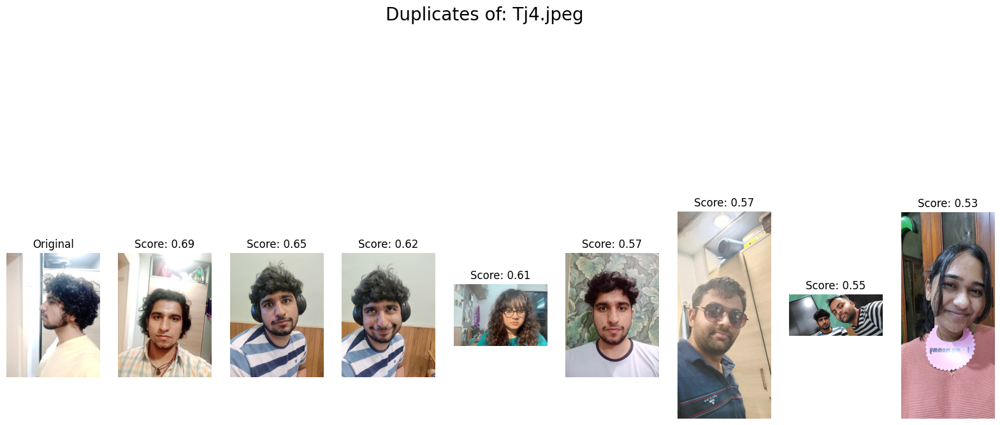

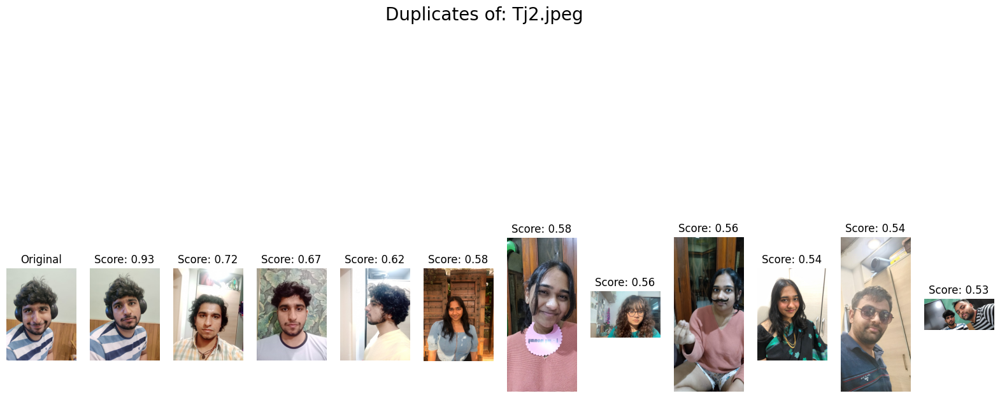

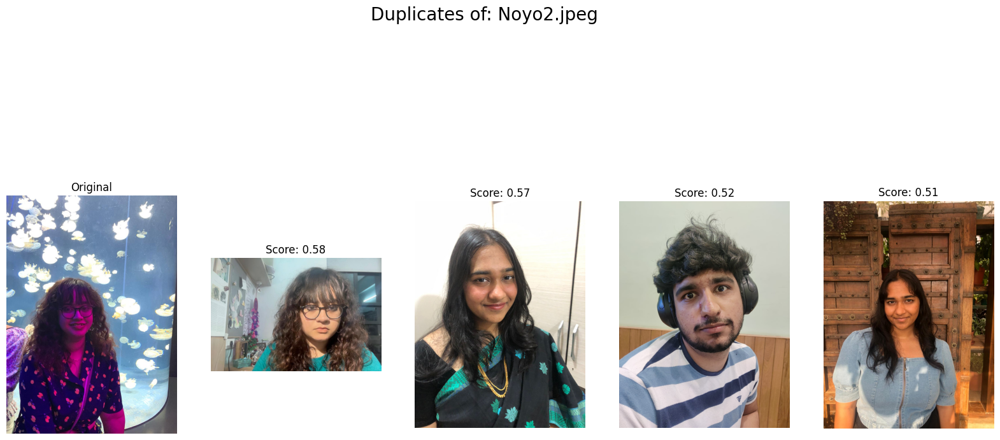

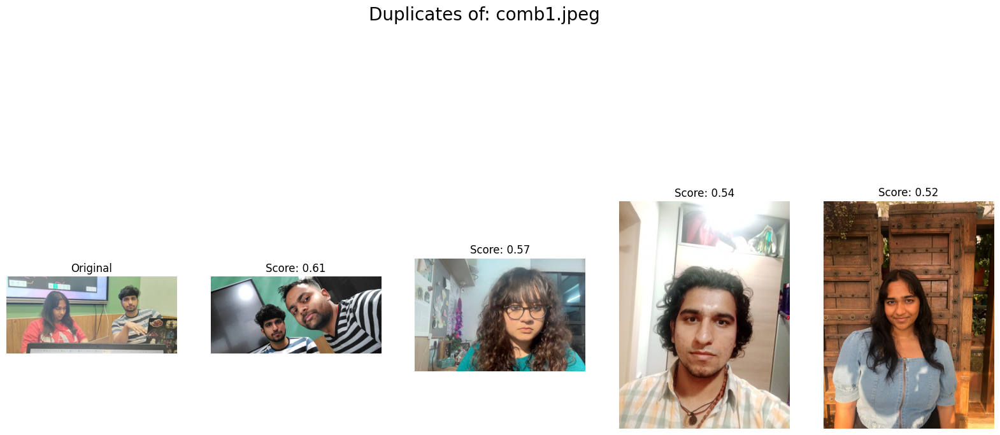

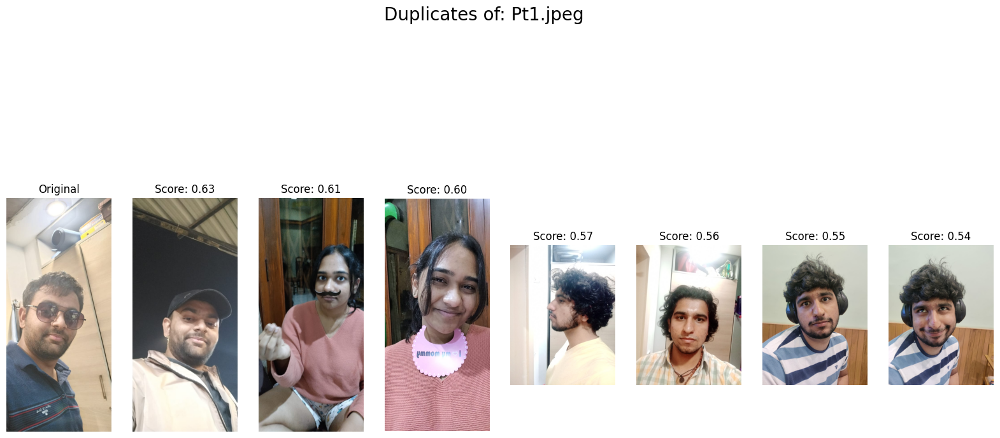

...

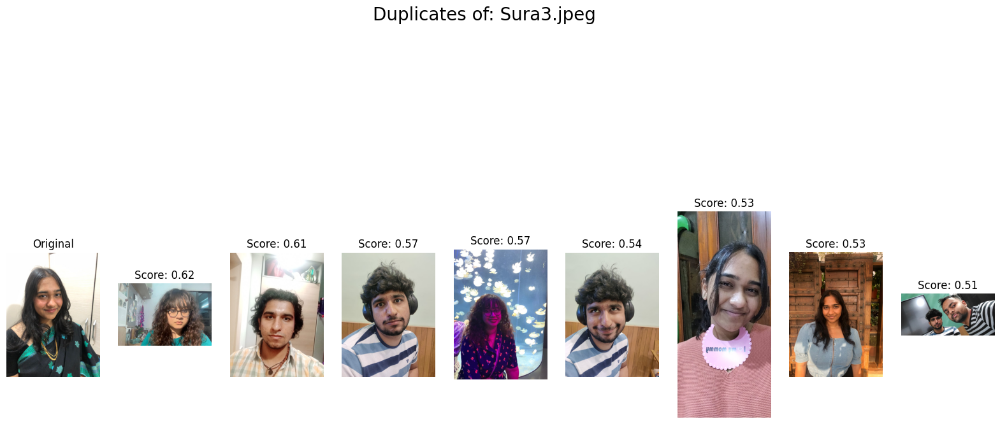

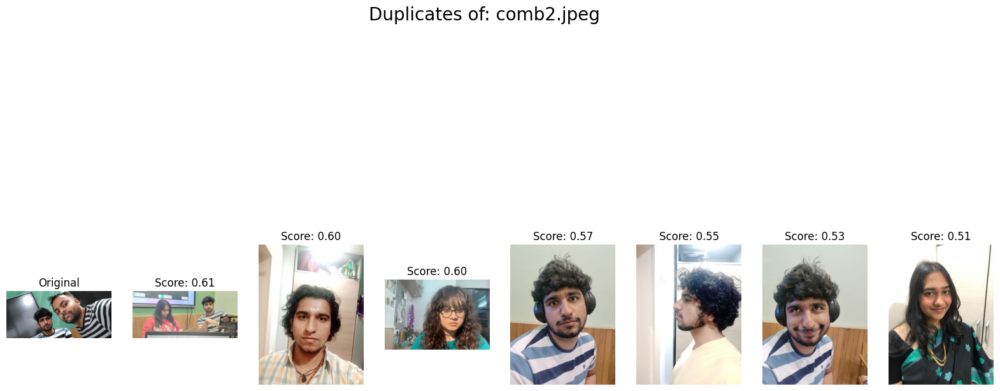

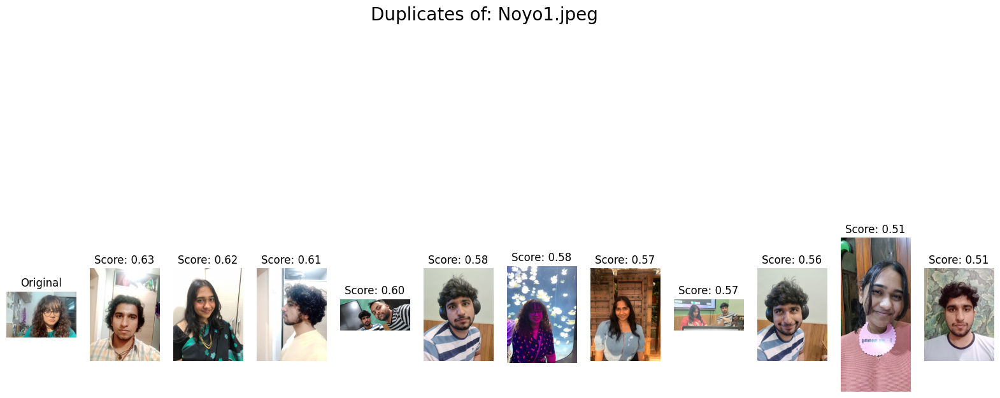

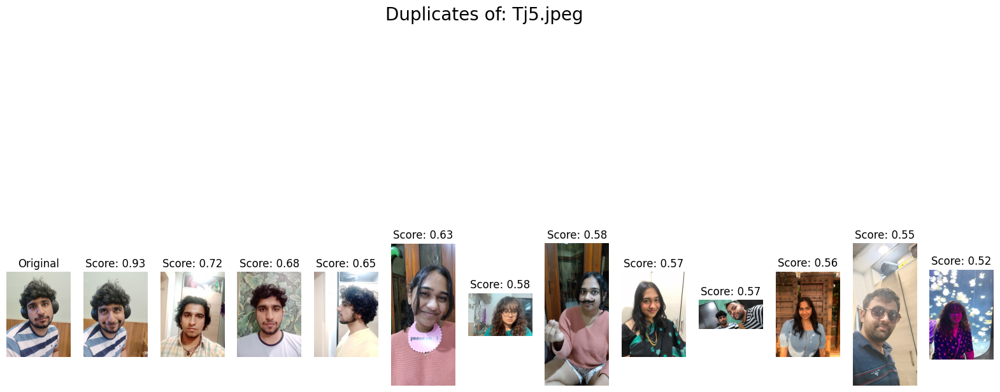

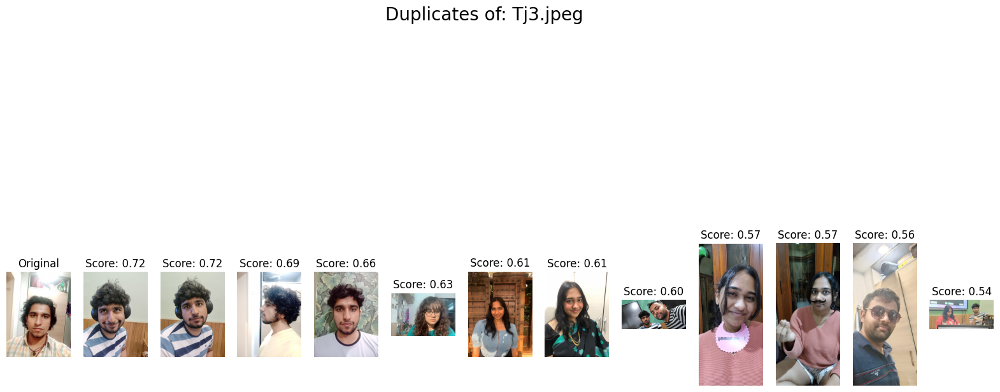

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def plot_similar_images(duplicates, image_dir):
    for key, values in duplicates.items():
        # Sort the duplicate images based on scores in descending order
        sorted_values = sorted(values, key=lambda x: x[1], reverse=True)
        
        # Plot the original image and its duplicates
        plt.figure(figsize=(20, 10))
        plt.suptitle(f'Duplicates of: {key}', fontsize=20)

        # Load and plot the original image
        original_img_path = os.path.join(image_dir, key)
        original_img = mpimg.imread(original_img_path)
        plt.subplot(1, len(sorted_values) + 1, 1)
        plt.imshow(original_img)
        plt.title('Original')
        plt.axis('off')

        # Load and plot each duplicate image with its score
        for i, (duplicate, score) in enumerate(sorted_values, start=2):
            duplicate_img_path = os.path.join(image_dir, duplicate)
            duplicate_img = mpimg.imread(duplicate_img_path)
            plt.subplot(1, len(sorted_values) + 1, i)
            plt.imshow(duplicate_img)
            plt.title(f'Score: {score:.2f}')
            plt.axis('off')
        
        plt.show()

# Use this function after you have the 'duplicates' dictionary ready,
# ensuring 'image_dir' is correctly set to your images directory.
plot_similar_images(duplicates, image_dir)
